In [219]:
import pandas as pd
import numpy as np
import os
import sys

In [220]:
TRAIN_PATH = './data/train'

In [221]:
def listFiles():
    map_dir_files = {}
    for d in os.listdir(TRAIN_PATH):
        d = os.path.join(TRAIN_PATH,d)
        if os.path.isdir(d):
            files = os.listdir(d)
            map_dir_files [d] = files
            sys.stderr.writelines("Nb files for %s: %d \n" % (d, len(files)))
    return map_dir_files

In [222]:
map_dir_files = listFiles()

Nb files for ./data/train\ALB: 1719 
Nb files for ./data/train\BET: 200 
Nb files for ./data/train\DOL: 117 
Nb files for ./data/train\LAG: 67 
Nb files for ./data/train\NoF: 465 
Nb files for ./data/train\OTHER: 299 
Nb files for ./data/train\SHARK: 176 
Nb files for ./data/train\YFT: 734 


In [223]:
from PIL import Image
import matplotlib.pyplot as plt
import random
%matplotlib inline

In [224]:
def plot_graph(dico, fish, nbfiles, nbcolumns):
    files = os.listdir(fish)
    nblines = int(nbfiles / nbcolumns)
    fig, ax = plt.subplots(nrows=nblines, ncols=nbcolumns, figsize=(15,15))
    ax = ax.flatten()
   
    for i in range(0,nbfiles):
        f = random.choice(files)
        img = Image.open(os.path.join(fish,random.choice(files)))
        ax[i].imshow(img)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
        ax[i].set_title("%s h:%s w:%s" % (f, img.height,img.width))
    plt.tight_layout()

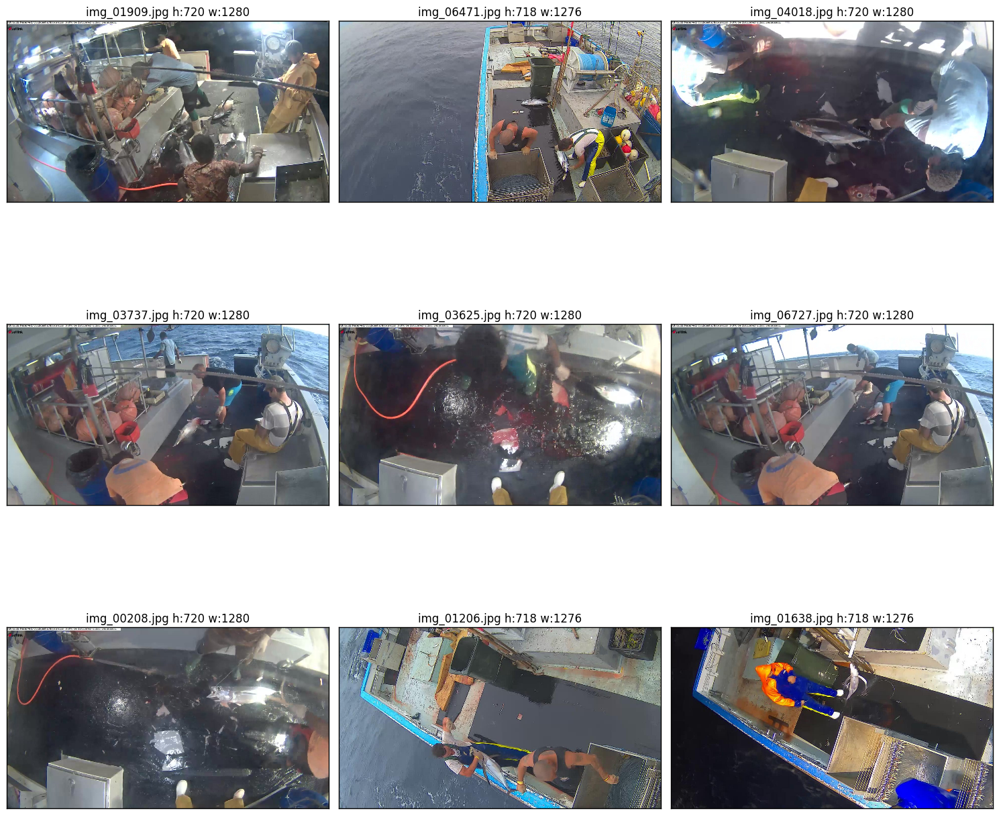

In [225]:
plot_graph(map_dir_files, os.path.join(TRAIN_PATH,'ALB'), 9, 3 )

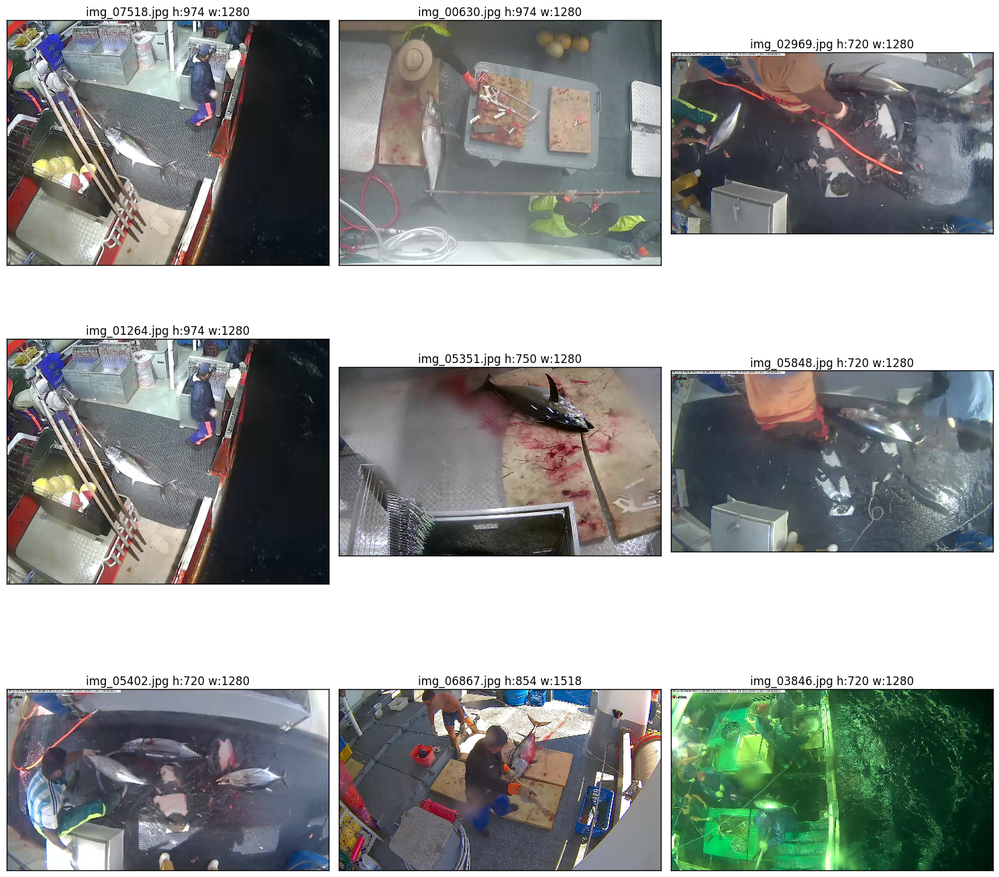

In [226]:
plot_graph(map_dir_files, os.path.join(TRAIN_PATH,'BET'), 9, 3 )

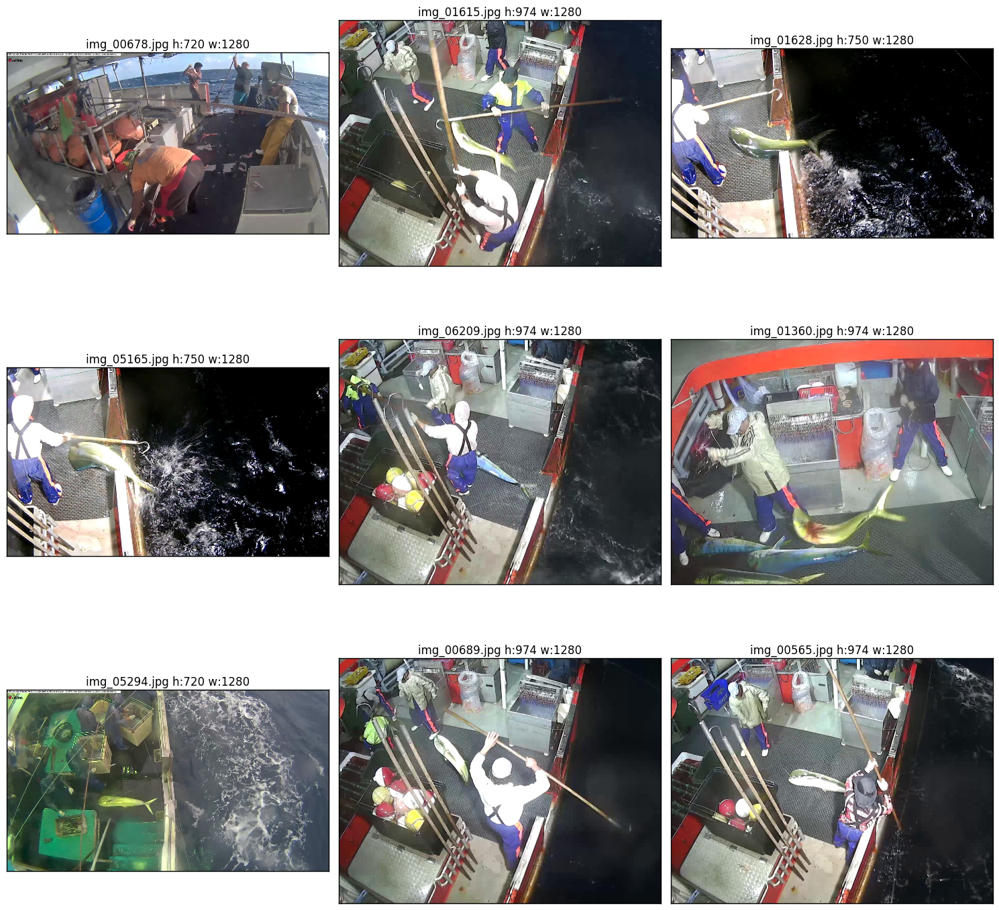

In [227]:
plot_graph(map_dir_files, os.path.join(TRAIN_PATH,'DOL'), 9, 3 )

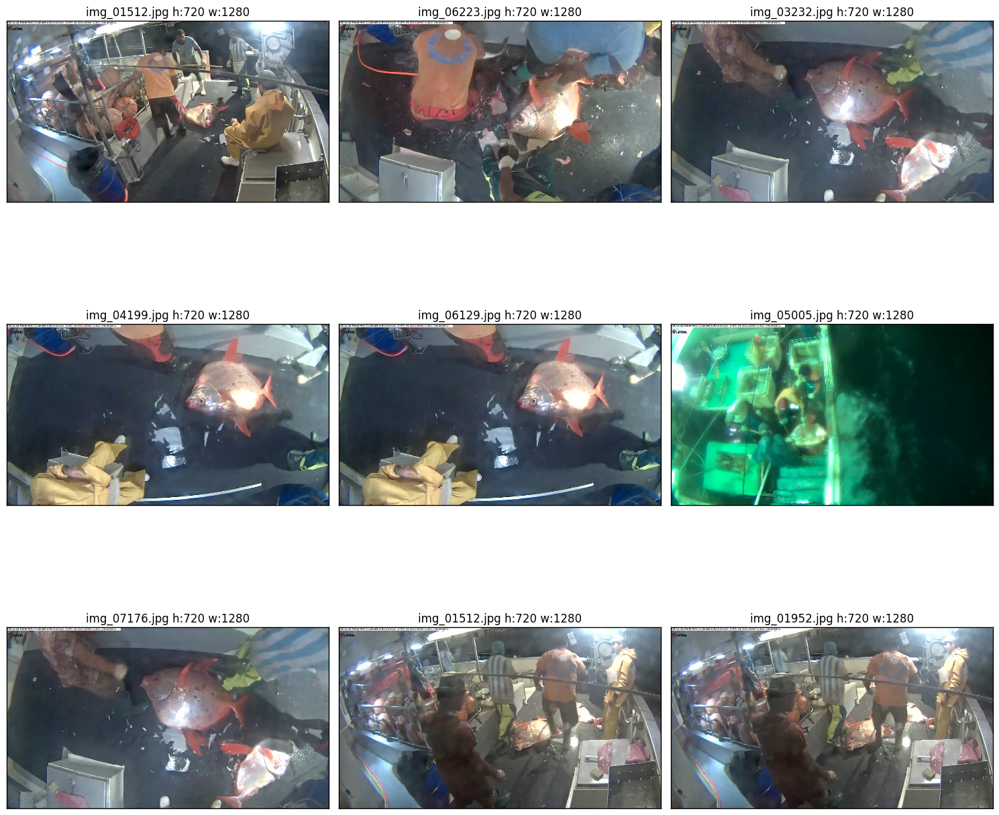

In [228]:
plot_graph(map_dir_files, os.path.join(TRAIN_PATH,'LAG'), 9, 3 )

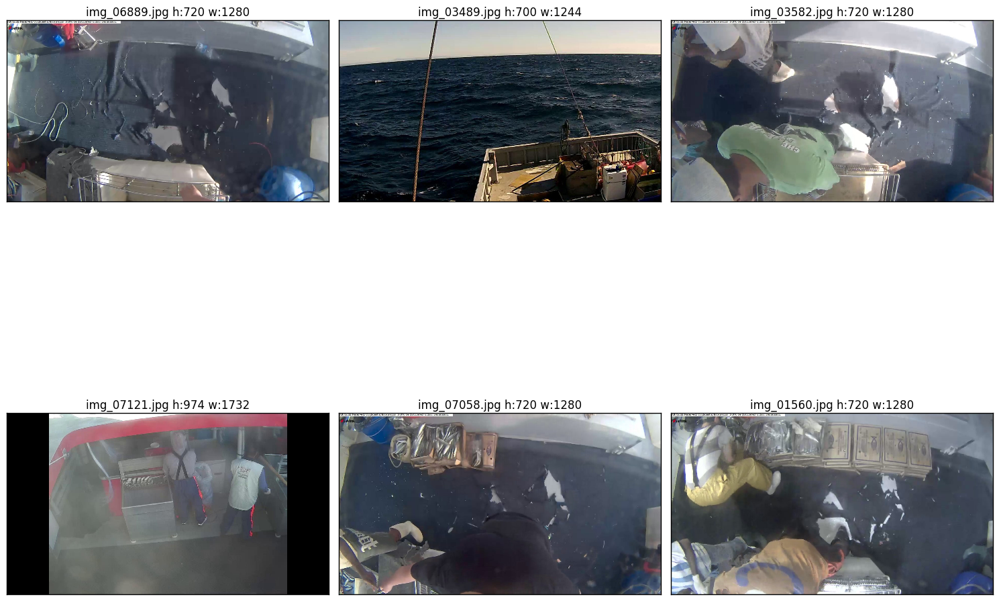

In [229]:
plot_graph(map_dir_files, os.path.join(TRAIN_PATH,'Nof'),6, 3 )

In [230]:
def get_all_files(root_dir):
    list_files = []
    for root, subdirs, files in os.walk(root_dir):
            list_files.extend([os.path.join(root,f) for f in files])
    return list_files

In [231]:
%time list_files = get_all_files(TRAIN_PATH)

Wall time: 62.8 ms


In [232]:
np_files = np.array(list_files)
%time shapes = [Image.open(f).size for f in list_files]

Wall time: 1.2 s


In [233]:
import pandas as pd

In [234]:
pd.Series(shapes).value_counts()

(1280, 720)    2174
(1280, 750)     598
(1280, 974)     395
(1276, 718)     220
(1192, 670)     198
(1280, 924)      60
(1518, 854)      39
(1732, 974)      35
(1334, 750)      31
(1244, 700)      27
dtype: int64